<a href="https://colab.research.google.com/github/Yousif-A2/Conv_AutoEncoder_Pytorch/blob/main/Yousif_Alnasser_Conv_AutoEncoder_Pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
import random
import time

In [3]:
import torch
import torch.nn as nn
from torchvision import datasets
from torchvision import transforms
from torch.utils.data import DataLoader
from torch.utils.data import SubsetRandomSampler
from torch.utils.data import sampler
import torch.nn.functional as F

In [4]:
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'  # or ':16:8'

In [5]:
cuda_device_num = 0
cuda_device = torch.device(f'cuda:{cuda_device_num}' if torch.cuda.is_available() else 'cpu')
print('Device:', cuda_device)

Device: cuda:0


In [6]:
if torch.cuda.is_available():
  # Useful for reproducibility as it ensures that the same algorithms are used across runs.
  torch.backends.cudnn.benchmark = False
  # Ensures that the cuDNN operations are deterministic and, therefore, the same input will produce the same output every time
  torch.backends.cudnn.deterministic = True
# Ensures that operations in PyTorch will behave deterministically
torch.use_deterministic_algorithms(True)

In [7]:
my_seed = 101
os.environ["PL_GLOBAL_SEED"] = str(my_seed)
random.seed(my_seed)
np.random.seed(my_seed)
torch.manual_seed(my_seed)
torch.cuda.manual_seed_all(my_seed)

In [8]:
lr_rate = 0.0005
batch_size = 32
num_epochs = 20

In [9]:
def get_dataloaders_mnist(batch_size, num_workers = 0,
                          validation_fraction = None,
                          train_transforms = None, test_transforms = None):

    if train_transforms is None:
        train_transforms = transforms.ToTensor()

    if test_transforms is None:
        test_transforms = transforms.ToTensor()

    train_dataset = datasets.MNIST(root = 'data',
                                   train = True,
                                   transform = train_transforms,
                                   download = True)

    valid_dataset = datasets.MNIST(root = 'data',
                                   train = True,
                                   transform = test_transforms)

    test_dataset = datasets.MNIST(root = 'data',
                                  train = False,
                                  transform = test_transforms)

    if validation_fraction is not None:
        num = int(validation_fraction * 60000)
        train_indices = torch.arange(0, 60000 - num)
        valid_indices = torch.arange(60000 - num, 60000)

        train_sampler = SubsetRandomSampler(train_indices)
        valid_sampler = SubsetRandomSampler(valid_indices)

        valid_loader = DataLoader(dataset = valid_dataset,
                                  batch_size = batch_size,
                                  num_workers = num_workers,
                                  sampler = valid_sampler)

        train_loader = DataLoader(dataset = train_dataset,
                                  batch_size = batch_size,
                                  num_workers = num_workers,
                                  drop_last = True,
                                  sampler = train_sampler)
    else:
        train_loader = DataLoader(dataset = train_dataset,
                                  batch_size = batch_size,
                                  num_workers = num_workers,
                                  shuffle = True)

    test_loader = DataLoader(dataset = test_dataset,
                             batch_size = batch_size,
                             num_workers = num_workers,
                             shuffle = False)

    if validation_fraction is None:
        return train_loader, test_loader
    else:
        return train_loader, valid_loader, test_loader

In [10]:
train_loader, valid_loader, test_loader = get_dataloaders_mnist(
    batch_size = batch_size,
    num_workers = 2,
    validation_fraction = 0.)

In [11]:
# Dataset Sanity check 1:
print('Training Set:\n')
for images, labels in train_loader:
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    print(labels[:10])
    break

# Dataset Sanity check 2:
print('\nValidation Set:')
for images, labels in valid_loader:
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    print(labels[:10])
    break

# Dataset Sanity check 3:
print('\nTesting Set:')
for images, labels in test_loader:
    print('Image batch dimensions:', images.size())
    print('Image label dimensions:', labels.size())
    print(labels[:10])
    break

Training Set:

Image batch dimensions: torch.Size([32, 1, 28, 28])
Image label dimensions: torch.Size([32])
tensor([0, 5, 7, 8, 6, 7, 9, 7, 1, 3])

Validation Set:

Testing Set:
Image batch dimensions: torch.Size([32, 1, 28, 28])
Image label dimensions: torch.Size([32])
tensor([7, 2, 1, 0, 4, 1, 4, 9, 5, 9])


In [12]:
# Helper Class 1: Reshape is used to reshape the embeddings to the correct image size
class Reshape(nn.Module):
    def __init__(self, *args):
        super().__init__()
        self.shape = args

    def forward(self, x):
        return x.view(self.shape)

In [13]:
# Helper Class 2: Trim is used to remove the excess pixels at the output of the decoder block (28x28 as MNIST size)
class Trim(nn.Module):
    def __init__(self, *args):
        super().__init__()

    def forward(self, x):
        return x[:, :, :28, :28]

In [14]:
class Conv_AutoEncoder(nn.Module):
    def __init__(self, embedding_size):
        super().__init__()
        self.embedding_size = embedding_size

        self.encoder = nn.Sequential( #784
                nn.Conv2d(1, 32, stride = (1, 1), kernel_size = (3, 3), padding = 1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(32, 64, stride = (2, 2), kernel_size = (3, 3), padding = 1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(64, 64, stride = (2, 2), kernel_size = (3, 3), padding = 1),
                nn.LeakyReLU(0.01),
                nn.Conv2d(64, 64, stride = (1, 1), kernel_size = (3, 3), padding = 1),
                nn.Flatten(),
                nn.Linear(3136, embedding_size)
        )
        self.decoder = nn.Sequential(
                torch.nn.Linear(embedding_size, 3136),
                Reshape(-1, 64, 7, 7),
                nn.ConvTranspose2d(64, 64, stride = (1, 1), kernel_size = (3, 3), padding = 1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(64, 64, stride = (2, 2), kernel_size = (3, 3), padding = 1),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(64, 32, stride = (2, 2), kernel_size = (3, 3), padding = 0),
                nn.LeakyReLU(0.01),
                nn.ConvTranspose2d(32, 1, stride = (1, 1), kernel_size = (3, 3), padding = 0),
                Trim(),  # 1x29x29 -> 1x28x28
                nn.Sigmoid()
                )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [15]:
model = Conv_AutoEncoder(embedding_size = 2)
print(model)
model.to(cuda_device)

optimizer = torch.optim.Adam(model.parameters(), lr = lr_rate)

Conv_AutoEncoder(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.01)
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.01)
    (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): Flatten(start_dim=1, end_dim=-1)
    (8): Linear(in_features=3136, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=2, out_features=3136, bias=True)
    (1): Reshape()
    (2): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.01)
    (4): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.01)
    (6): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2))
    (7): L

In [16]:
def compute_epoch_loss_autoencoder(model, data_loader, loss_fn, device):
    model.eval()
    curr_loss, num_examples = 0., 0
    with torch.no_grad():
        for features, _ in data_loader:
            features = features.to(device)
            logits = model(features)
            loss = loss_fn(logits, features, reduction = 'sum')
            num_examples += features.size(0)
            curr_loss += loss

        curr_loss = curr_loss / num_examples
        return curr_loss

In [17]:
def train_autoencoder_v1(num_epochs, model, optimizer, device,
                         train_loader, loss_fn = None,
                         logging_interval = 100,
                         skip_epoch_stats = False,
                         save_model = None):

    log_dict = {'train_loss_per_batch': [],
                'train_loss_per_epoch': []}

    if loss_fn is None:
        loss_fn = F.mse_loss

    start_time = time.time()
    for epoch in range(num_epochs):

        model.train()
        for batch_idx, (features, _) in enumerate(train_loader):

            features = features.to(device)

            # Forward and backpropagation ste[s]
            logits = model(features)
            loss = loss_fn(logits, features)
            optimizer.zero_grad()

            loss.backward()

            # Model weights' update
            optimizer.step()

            # Performance logging
            log_dict['train_loss_per_batch'].append(loss.item())

            if not batch_idx % logging_interval:
                print('Epoch: %03d/%03d | Batch %04d/%04d | Loss: %.4f'
                      % (epoch+1, num_epochs, batch_idx,
                          len(train_loader), loss))

        if not skip_epoch_stats:
            model.eval()

            with torch.set_grad_enabled(False):  # Will help save memory during inference

                train_loss = compute_epoch_loss_autoencoder(
                    model, train_loader, loss_fn, device)
                print('***Epoch: %03d/%03d | Loss: %.3f' % (
                      epoch+1, num_epochs, train_loss))
                log_dict['train_loss_per_epoch'].append(train_loss.item())

        print('Time elapsed: %.2f min' % ((time.time() - start_time)/60))

    print('Total Training Time: %.2f min' % ((time.time() - start_time)/60))
    if save_model is not None:
        torch.save(model.state_dict(), save_model)

    return log_dict

In [18]:
log_dict = train_autoencoder_v1(num_epochs = num_epochs, model = model,
                                optimizer = optimizer, device = cuda_device,
                                train_loader = train_loader,
                                skip_epoch_stats = True,
                                logging_interval = 250)

Epoch: 001/020 | Batch 0000/1875 | Loss: 0.2602
Epoch: 001/020 | Batch 0250/1875 | Loss: 0.0629
Epoch: 001/020 | Batch 0500/1875 | Loss: 0.0545
Epoch: 001/020 | Batch 0750/1875 | Loss: 0.0531
Epoch: 001/020 | Batch 1000/1875 | Loss: 0.0444
Epoch: 001/020 | Batch 1250/1875 | Loss: 0.0426
Epoch: 001/020 | Batch 1500/1875 | Loss: 0.0457
Epoch: 001/020 | Batch 1750/1875 | Loss: 0.0480
Time elapsed: 0.34 min
Epoch: 002/020 | Batch 0000/1875 | Loss: 0.0428
Epoch: 002/020 | Batch 0250/1875 | Loss: 0.0401
Epoch: 002/020 | Batch 0500/1875 | Loss: 0.0445
Epoch: 002/020 | Batch 0750/1875 | Loss: 0.0437
Epoch: 002/020 | Batch 1000/1875 | Loss: 0.0399
Epoch: 002/020 | Batch 1250/1875 | Loss: 0.0442
Epoch: 002/020 | Batch 1500/1875 | Loss: 0.0453
Epoch: 002/020 | Batch 1750/1875 | Loss: 0.0502
Time elapsed: 0.66 min
Epoch: 003/020 | Batch 0000/1875 | Loss: 0.0380
Epoch: 003/020 | Batch 0250/1875 | Loss: 0.0417
Epoch: 003/020 | Batch 0500/1875 | Loss: 0.0435
Epoch: 003/020 | Batch 0750/1875 | Loss: 0

In [19]:
torch.save(model.state_dict(), '/content/conv_ae_model.pth')

In [20]:
torch.save(model, '/content/conv_ae_model_complete.pth')

In [21]:
def plot_training_loss(minibatch_losses, num_epochs, averaging_iterations = 100, custom_label = ''):

    iter_per_epoch = len(minibatch_losses) // num_epochs

    plt.figure()
    ax1 = plt.subplot(1, 1, 1)
    ax1.plot(range(len(minibatch_losses)),
             (minibatch_losses), label = f'Minibatch Loss{custom_label}')
    ax1.set_xlabel('Iterations')
    ax1.set_ylabel('Loss')

    if len(minibatch_losses) < 1000:
        num_losses = len(minibatch_losses) // 2
    else:
        num_losses = 1000

    ax1.set_ylim([
        0, np.max(minibatch_losses[num_losses:])*1.5
        ])

    ax1.plot(np.convolve(minibatch_losses,
                         np.ones(averaging_iterations,)/averaging_iterations,
                         mode = 'valid'),
             label = f'Running Average{custom_label}')
    ax1.legend()

    ###################
    # Set scond x-axis
    ax2 = ax1.twiny()
    newlabel = list(range(num_epochs+1))

    newpos = [e*iter_per_epoch for e in newlabel]

    ax2.set_xticks(newpos[::10])
    ax2.set_xticklabels(newlabel[::10])

    ax2.xaxis.set_ticks_position('bottom')
    ax2.xaxis.set_label_position('bottom')
    ax2.spines['bottom'].set_position(('outward', 45))
    ax2.set_xlabel('Epochs')
    ax2.set_xlim(ax1.get_xlim())
    ###################

    plt.tight_layout()

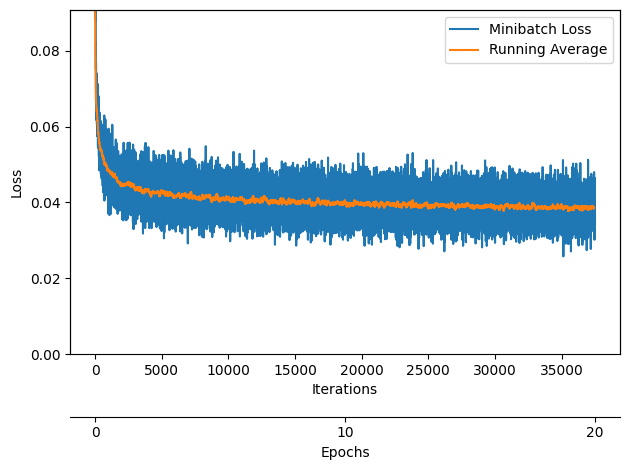

In [22]:
plot_training_loss(log_dict['train_loss_per_batch'], num_epochs)
plt.show()

In [23]:
def plot_generated_images(data_loader, model, device,
                          unnormalizer = None,
                          figsize = (20, 2.5), n_images = 15, modeltype = 'autoencoder'):

    fig, axes = plt.subplots(nrows = 2, ncols = n_images,
                             sharex = True, sharey = True, figsize = figsize)

    for batch_idx, (features, _) in enumerate(data_loader):

        features = features.to(device)

        color_channels = features.shape[1]
        image_height = features.shape[2]
        image_width = features.shape[3]

        with torch.no_grad():
            if modeltype == 'autoencoder':
                decoded_images = model(features)[:n_images]
            elif modeltype == 'VAE':
                encoded, z_mean, z_log_var, decoded_images = model(features)[:n_images]
            else:
                raise ValueError('`modeltype` not supported')

        orig_images = features[:n_images]
        break

    for i in range(n_images):
        for ax, img in zip(axes, [orig_images, decoded_images]):
            curr_img = img[i].detach().to(torch.device('cpu'))
            if unnormalizer is not None:
                curr_img = unnormalizer(curr_img)

            if color_channels > 1:
                curr_img = np.transpose(curr_img, (1, 2, 0))
                ax[i].imshow(curr_img)
            else:
                ax[i].imshow(curr_img.view((image_height, image_width)), cmap = 'binary')

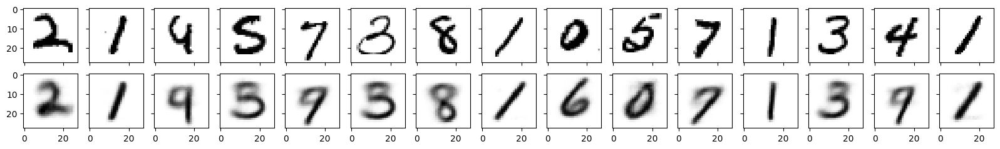

In [24]:
plot_generated_images(data_loader = train_loader, model = model, device = cuda_device)

In [25]:
def plot_latent_space_with_labels(num_classes, data_loader, model, device):
    d = {i:[] for i in range(num_classes)}

    model.eval()
    with torch.no_grad():
        for i, (features, targets) in enumerate(data_loader):

            features = features.to(device)
            targets = targets.to(device)

            embedding = model.encoder(features)

            for i in range(num_classes):
                if i in targets:
                    mask = targets == i
                    d[i].append(embedding[mask].to('cpu').numpy())

    colors = list(mcolors.TABLEAU_COLORS.items())
    for i in range(num_classes):
        d[i] = np.concatenate(d[i])
        plt.scatter(
            d[i][:, 0], d[i][:, 1],
            color = colors[i][1],
            label = f'{i}',
            alpha = 0.5)

    plt.legend()

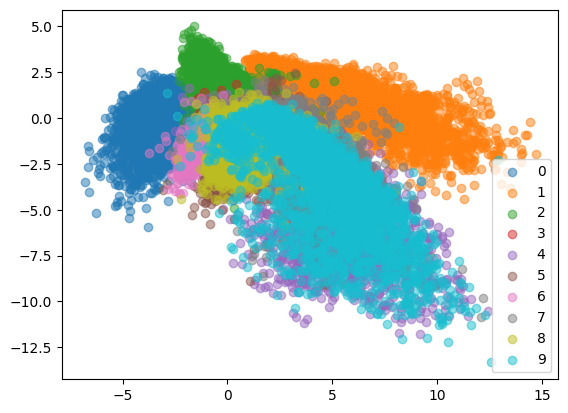

In [26]:
num_classes = 10
plot_latent_space_with_labels(
    num_classes = num_classes,
    data_loader = train_loader,
    model = model,
    device = cuda_device)

plt.legend()
plt.show()

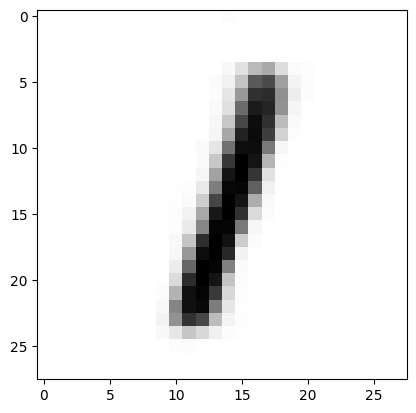

In [27]:
with torch.no_grad():
    new_image = model.decoder(torch.tensor([3.2, 1.5]).to(cuda_device))
    new_image.squeeze_(0)
    new_image.squeeze_(0)
plt.imshow(new_image.to('cpu').numpy(), cmap = 'binary')
plt.show()

In [86]:
model = Conv_AutoEncoder(embedding_size=2)  # Initialize the model
# Option 1: Loading model params
model.load_state_dict(torch.load('/content/conv_ae_model.pth'))
model.to(cuda_device) # This line is added to move the model to the GPU
model.eval()  # Set to evaluation mode

# Option 2: Loading full model
# model = torch.load('/content/conv_ae_model_complete.pth')
# model.eval()  # Set to evaluation mode

Conv_AutoEncoder(
  (encoder): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.01)
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.01)
    (4): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): Flatten(start_dim=1, end_dim=-1)
    (8): Linear(in_features=3136, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=2, out_features=3136, bias=True)
    (1): Reshape()
    (2): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): LeakyReLU(negative_slope=0.01)
    (4): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): LeakyReLU(negative_slope=0.01)
    (6): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2))
    (7): L

In [29]:
all_embeddings = torch.zeros((10_000, 2))

num_images = 0
for images, labels in train_loader:

    if num_images >= 10_000:
        break

    begin = num_images
    end = begin + images.size(0)
    end = min(end, 10_000)


    images, labels = images.to(cuda_device), labels.to(cuda_device)

    with torch.no_grad():
        embeddings = model.encoder(images).to('cpu')

    # Adjust the slice size to match the available space:
    all_embeddings[begin:end] = embeddings[:end-begin]


    num_images = end

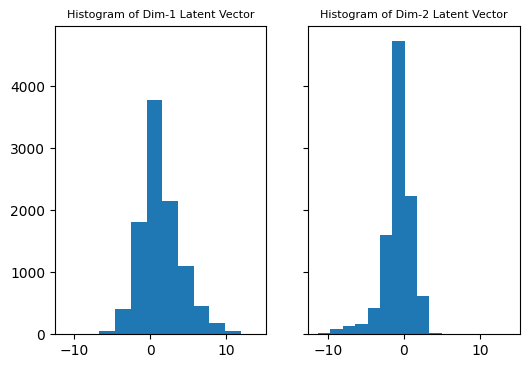

In [30]:
fig, axes = plt.subplots(nrows = 1, ncols = 2,
                         sharex = True, sharey = True,
                         figsize = (6, 4))

axes[0].hist(all_embeddings[:, 0].numpy())
axes[0].set_title('Histogram of Dim-1 Latent Vector', fontsize = 8)
axes[1].hist(all_embeddings[:, 1].numpy())
axes[1].set_title('Histogram of Dim-2 Latent Vector', fontsize = 8)
plt.show()

In [31]:
def extract_embeddings(model, dataloader, device='cuda', max_images=10_000):
    model.eval()
    embeddings_dim = model.encoder(next(iter(dataloader))[0].to(device)).shape[1]
    all_embeddings = torch.zeros((max_images, embeddings_dim))

    num_images = 0
    with torch.no_grad():
        for images, _ in dataloader:
            if num_images >= max_images:
                break

            batch_size = images.size(0)
            begin = num_images
            end = min(begin + batch_size, max_images)

            images = images.to(device)
            embeddings = model.encoder(images).to('cpu')

            all_embeddings[begin:end] = embeddings[:end-begin]
            num_images = end

    return all_embeddings


In [32]:
def decode_and_plot(model, latent_vector, device='cuda', cmap='binary'):
    model.eval()
    with torch.no_grad():
        # Ensure latent vector is a tensor and has batch dimension
        latent_tensor = torch.tensor(latent_vector, dtype=torch.float32).to(device)
        if latent_tensor.ndim == 1:
            latent_tensor = latent_tensor.unsqueeze(0)

        decoded_image = model.decoder(latent_tensor)
        decoded_image = decoded_image.squeeze()  # remove all dimensions of size 1

        # Move to CPU and plot
        plt.imshow(decoded_image.to('cpu').numpy(), cmap=cmap)
        plt.axis('off')
        plt.show()

In [71]:
import matplotlib.animation as animation
from IPython.display import HTML

def create_embedding_animation(model, test_loader, device):
    model.eval()

    # Get first test batch
    test_batch = next(iter(test_loader))[0].to(device)

    # Create figure
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

    # Get original embedding
    with torch.no_grad():
        orig_embedding = model.encoder(test_batch[0:1])
        orig_img = model.decoder(orig_embedding).cpu()

    # Initialize plots
    im1 = ax1.imshow(test_batch[0].cpu().squeeze(), cmap='gray')
    im2 = ax2.imshow(orig_img.squeeze(), cmap='gray')
    ax1.set_title('Original Image')
    ax2.set_title('Reconstructed Image')
    plt.close()

    def update(frame):
        # Modify first embedding dimension
        modified_embedding = orig_embedding.clone()
        modified_embedding[0,0] = frame  # Vary first dimension

        # Reconstruct
        with torch.no_grad():
            recon_img = model.decoder(modified_embedding).cpu()

        # Update images
        im1.set_data(test_batch[0].cpu().squeeze())
        im2.set_data(recon_img.squeeze())
        ax2.set_title(f'Reconstructed (z1={frame:.1f})')
        return im1, im2

    # Create animation
    ani = animation.FuncAnimation(
        fig, update,
        frames=np.arange(-10, 10, 0.1),
        interval=50
    )

    return ani

# Part 1

# Training with 5 Embedding

In [72]:
model_5e = Conv_AutoEncoder(embedding_size=5).to(cuda_device)
optimizer_5e = torch.optim.Adam(model_5e.parameters(), lr=lr_rate)

    # Train model
log_dict_5e = train_autoencoder_v1(
        num_epochs=num_epochs,
        model=model_5e,
        optimizer=optimizer_5e,
        device=cuda_device,
        train_loader=train_loader,
        skip_epoch_stats=True,
        logging_interval=250
    )

Epoch: 001/020 | Batch 0000/1875 | Loss: 0.1991
Epoch: 001/020 | Batch 0250/1875 | Loss: 0.0418
Epoch: 001/020 | Batch 0500/1875 | Loss: 0.0334
Epoch: 001/020 | Batch 0750/1875 | Loss: 0.0299
Epoch: 001/020 | Batch 1000/1875 | Loss: 0.0367
Epoch: 001/020 | Batch 1250/1875 | Loss: 0.0322
Epoch: 001/020 | Batch 1500/1875 | Loss: 0.0287
Epoch: 001/020 | Batch 1750/1875 | Loss: 0.0280
Time elapsed: 0.33 min
Epoch: 002/020 | Batch 0000/1875 | Loss: 0.0277
Epoch: 002/020 | Batch 0250/1875 | Loss: 0.0313
Epoch: 002/020 | Batch 0500/1875 | Loss: 0.0254
Epoch: 002/020 | Batch 0750/1875 | Loss: 0.0288
Epoch: 002/020 | Batch 1000/1875 | Loss: 0.0230
Epoch: 002/020 | Batch 1250/1875 | Loss: 0.0280
Epoch: 002/020 | Batch 1500/1875 | Loss: 0.0355
Epoch: 002/020 | Batch 1750/1875 | Loss: 0.0266
Time elapsed: 0.65 min
Epoch: 003/020 | Batch 0000/1875 | Loss: 0.0265
Epoch: 003/020 | Batch 0250/1875 | Loss: 0.0244
Epoch: 003/020 | Batch 0500/1875 | Loss: 0.0244
Epoch: 003/020 | Batch 0750/1875 | Loss: 0

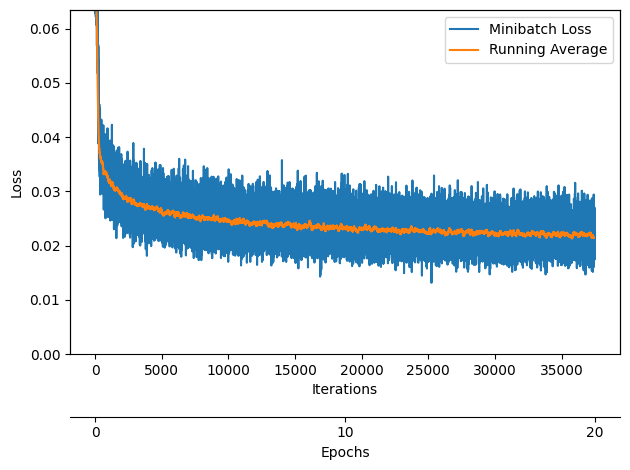

In [73]:
plot_training_loss(log_dict_5e['train_loss_per_batch'], num_epochs)
plt.show()

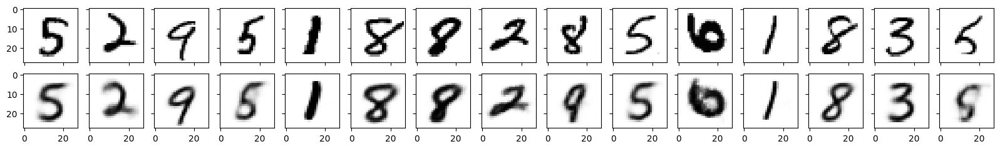

In [74]:
plot_generated_images(data_loader = train_loader, model = model_5e, device = cuda_device)

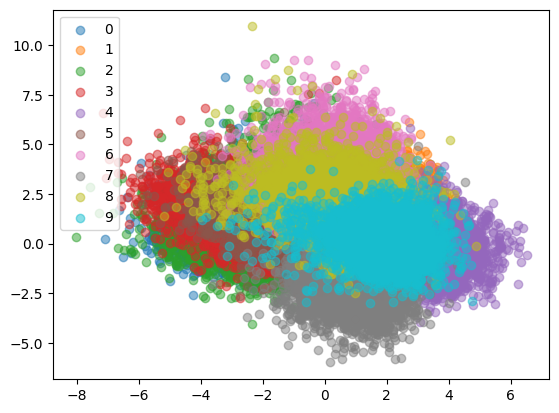

In [75]:
plot_latent_space_with_labels(
    num_classes = num_classes,
    data_loader = train_loader,
    model = model_5e,
    device = cuda_device)

plt.legend()
plt.show()

<ipython-input-32-4d4ce4c5715a>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  latent_tensor = torch.tensor(latent_vector, dtype=torch.float32).to(device)


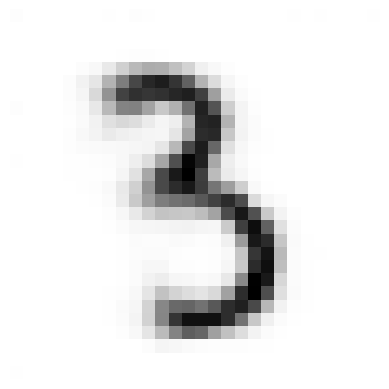

In [76]:
# Extract embeddings
embeddings = extract_embeddings(model_5e, train_loader, device=cuda_device)

# Decode a specific embedding
decode_and_plot(model_5e, embeddings[0], device=cuda_device)


In [77]:
animation_5e = create_embedding_animation(model_5e, test_loader, cuda_device)
HTML(animation_5e.to_jshtml())

In [78]:
animation_5e.save('embedding_animation_5e.gif', writer='imagemagick')

# Training with 10 Embedding

In [41]:
model_10e = Conv_AutoEncoder(embedding_size=10).to(cuda_device)
optimizer_10e = torch.optim.Adam(model_10e.parameters(), lr=lr_rate)

    # Train model
log_dict_10e = train_autoencoder_v1(
        num_epochs=num_epochs,
        model=model_10e,
        optimizer=optimizer_10e,
        device=cuda_device,
        train_loader=train_loader,
        skip_epoch_stats=True,
        logging_interval=250
    )

Epoch: 001/020 | Batch 0000/1875 | Loss: 0.2583
Epoch: 001/020 | Batch 0250/1875 | Loss: 0.0578
Epoch: 001/020 | Batch 0500/1875 | Loss: 0.0247
Epoch: 001/020 | Batch 0750/1875 | Loss: 0.0208
Epoch: 001/020 | Batch 1000/1875 | Loss: 0.0223
Epoch: 001/020 | Batch 1250/1875 | Loss: 0.0167
Epoch: 001/020 | Batch 1500/1875 | Loss: 0.0184
Epoch: 001/020 | Batch 1750/1875 | Loss: 0.0156
Time elapsed: 0.32 min
Epoch: 002/020 | Batch 0000/1875 | Loss: 0.0185
Epoch: 002/020 | Batch 0250/1875 | Loss: 0.0173
Epoch: 002/020 | Batch 0500/1875 | Loss: 0.0153
Epoch: 002/020 | Batch 0750/1875 | Loss: 0.0145
Epoch: 002/020 | Batch 1000/1875 | Loss: 0.0186
Epoch: 002/020 | Batch 1250/1875 | Loss: 0.0169
Epoch: 002/020 | Batch 1500/1875 | Loss: 0.0163
Epoch: 002/020 | Batch 1750/1875 | Loss: 0.0129
Time elapsed: 0.65 min
Epoch: 003/020 | Batch 0000/1875 | Loss: 0.0158
Epoch: 003/020 | Batch 0250/1875 | Loss: 0.0144
Epoch: 003/020 | Batch 0500/1875 | Loss: 0.0129
Epoch: 003/020 | Batch 0750/1875 | Loss: 0

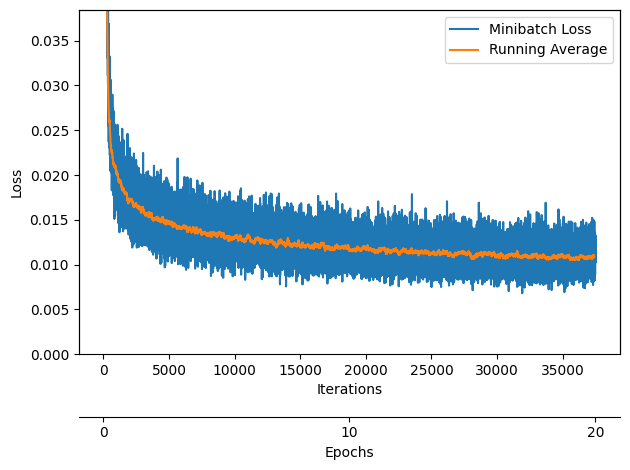

In [42]:
plot_training_loss(log_dict_10e['train_loss_per_batch'], num_epochs)

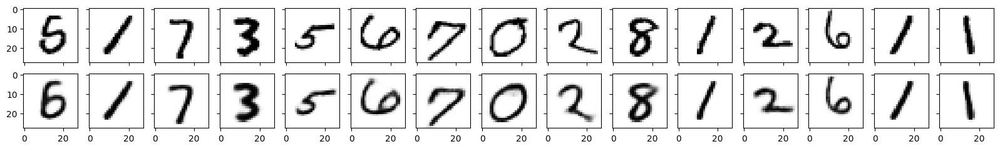

In [43]:
plot_generated_images(data_loader = train_loader, model = model_10e, device = cuda_device)

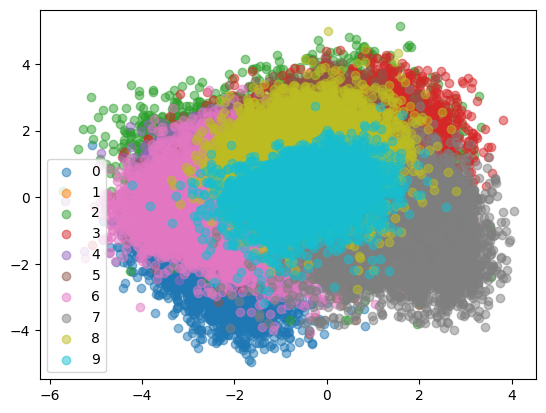

In [44]:
plot_latent_space_with_labels(
    num_classes = num_classes,
    data_loader = train_loader,
    model = model_10e,
    device = cuda_device)

plt.legend()
plt.show()

<ipython-input-32-4d4ce4c5715a>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  latent_tensor = torch.tensor(latent_vector, dtype=torch.float32).to(device)


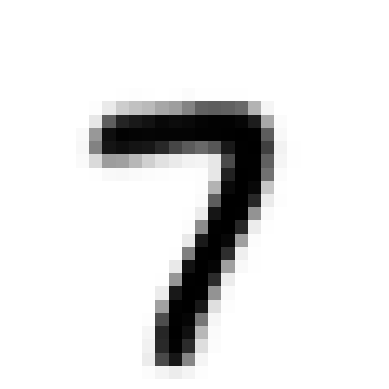

In [45]:
# Extract embeddings
embeddings = extract_embeddings(model_10e, train_loader, device=cuda_device)

# Decode a specific embedding
decode_and_plot(model_10e, embeddings[0], device=cuda_device)


In [79]:
animation_10e = create_embedding_animation(model_10e, test_loader, cuda_device)
HTML(animation_10e.to_jshtml())

In [80]:
animation_10e.save('embedding_animation_10e.gif', writer='imagemagick')

# Training with 20 Embedding

In [49]:
model_20e = Conv_AutoEncoder(embedding_size=20).to(cuda_device)
optimizer_20e = torch.optim.Adam(model_20e.parameters(), lr=lr_rate)

    # Train model
log_dict_20e = train_autoencoder_v1(
        num_epochs=num_epochs,
        model=model_20e,
        optimizer=optimizer_20e,
        device=cuda_device,
        train_loader=train_loader,
        skip_epoch_stats=True,
        logging_interval=250
    )

Epoch: 001/020 | Batch 0000/1875 | Loss: 0.3030
Epoch: 001/020 | Batch 0250/1875 | Loss: 0.0597
Epoch: 001/020 | Batch 0500/1875 | Loss: 0.0234
Epoch: 001/020 | Batch 0750/1875 | Loss: 0.0117
Epoch: 001/020 | Batch 1000/1875 | Loss: 0.0123
Epoch: 001/020 | Batch 1250/1875 | Loss: 0.0113
Epoch: 001/020 | Batch 1500/1875 | Loss: 0.0101
Epoch: 001/020 | Batch 1750/1875 | Loss: 0.0110
Time elapsed: 0.31 min
Epoch: 002/020 | Batch 0000/1875 | Loss: 0.0089
Epoch: 002/020 | Batch 0250/1875 | Loss: 0.0091
Epoch: 002/020 | Batch 0500/1875 | Loss: 0.0079
Epoch: 002/020 | Batch 0750/1875 | Loss: 0.0074
Epoch: 002/020 | Batch 1000/1875 | Loss: 0.0075
Epoch: 002/020 | Batch 1250/1875 | Loss: 0.0098
Epoch: 002/020 | Batch 1500/1875 | Loss: 0.0070
Epoch: 002/020 | Batch 1750/1875 | Loss: 0.0088
Time elapsed: 0.65 min
Epoch: 003/020 | Batch 0000/1875 | Loss: 0.0074
Epoch: 003/020 | Batch 0250/1875 | Loss: 0.0069
Epoch: 003/020 | Batch 0500/1875 | Loss: 0.0065
Epoch: 003/020 | Batch 0750/1875 | Loss: 0

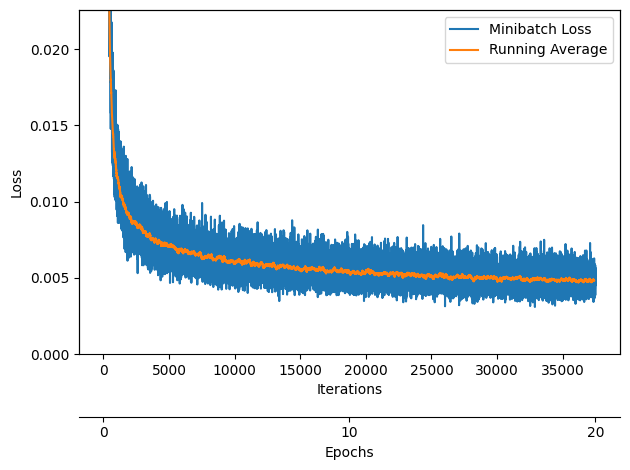

In [50]:
plot_training_loss(log_dict_20e['train_loss_per_batch'], num_epochs)


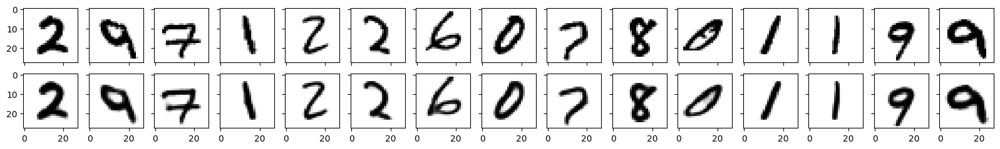

In [51]:
plot_generated_images(data_loader = train_loader, model = model_20e, device = cuda_device)

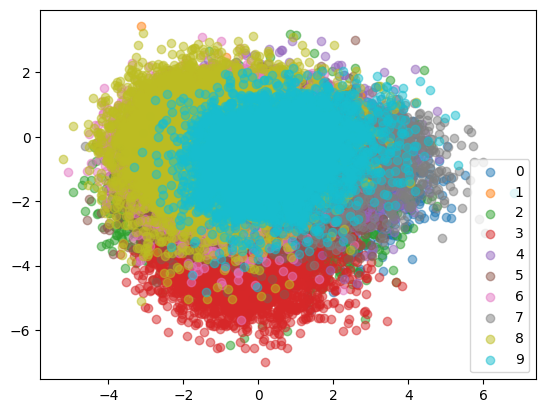

In [52]:
plot_latent_space_with_labels(
    num_classes = num_classes,
    data_loader = train_loader,
    model = model_20e,
    device = cuda_device)

plt.legend()
plt.show()

<ipython-input-32-4d4ce4c5715a>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  latent_tensor = torch.tensor(latent_vector, dtype=torch.float32).to(device)


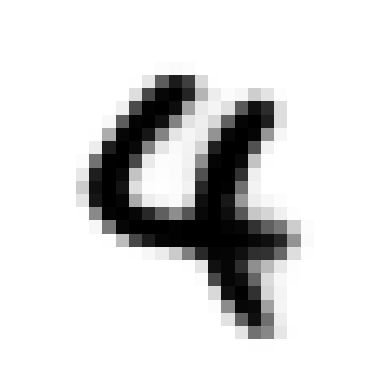

In [55]:
# Extract embeddings
embeddings = extract_embeddings(model_20e, train_loader, device=cuda_device)

# Decode a specific embedding
decode_and_plot(model_20e, embeddings[0], device=cuda_device)


In [85]:
animation_20e = create_embedding_animation(model_20e, test_loader, cuda_device)
HTML(animation_20e.to_jshtml())

In [84]:
animation_20e.save('embedding_animation_20e.gif', writer='imagemagick')